# [Synth800K Dataset](https://www.robots.ox.ac.uk/~vgg/data/scenetext/)

As mentioned in the description, it is a synthetically generated dataset, in which word instances are placed in natural scene images, while taking into account the scene layout. The dataset contains 800K images with approximately 8 million synthetic word instances. Each text instance is annotated with its text-string, word-level and character-level bounding-boxes.

In [1]:
# Imports
import os
import re

import cv2

import scipy.io

import numpy as np
import pandas as pd

from tqdm import tqdm

import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.patches as patches

In [2]:
BASE_DIR = '/content/content/SynthText'

### Download the dataset

The dataset can be downloaded from here: https://www.robots.ox.ac.uk/~vgg/data/scenetext/

In [ ]:
!rm -rf /content/sample_data
!wget https://thor.robots.ox.ac.uk/~vgg/data/scenetext/SynthText.zip

# Unzip only some directories for EDA
!unzip -qq /content/SynthText.zip "SynthText/gt.mat" -d "."
!unzip -qq /content/SynthText.zip "SynthText/48/*" -d "."
!unzip -qq /content/SynthText.zip "SynthText/139/*" -d "."
!unzip -qq /content/SynthText.zip "SynthText/193/*" -d "."
!unzip -qq /content/SynthText.zip "SynthText/148/*" -d "."
!unzip -qq /content/SynthText.zip "SynthText/117/*" -d "."

# Make a zip and save to drive for further use
!zip -r -qq small_synth_text.zip /content/SynthText/*
!mv /content/small_synth_text.zip /content/drive/MyDrive/cs2/

In [ ]:
# Make a zip and save to drive for further use
!zip -r -qq small_synth_text.zip /content/SynthText/*
!mv /content/small_synth_text.zip /content/drive/MyDrive/cs2/

In [5]:
!unzip -qq /content/drive/MyDrive/cs2/small_synth_text.zip

In [3]:
# Load the ground truth matrix
# Reference: https://www.robots.ox.ac.uk/~vgg/data/scenetext/readme.txt
mat = scipy.io.loadmat(f'{BASE_DIR}/gt.mat')
mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'charBB', 'wordBB', 'imnames', 'txt'])

In [4]:
mat_dict = {
    'imnames': np.concatenate(mat['imnames'][0], axis=0),
    'charBB': np.concatenate(mat['charBB'], axis=0),
    'wordBB': np.concatenate(mat['wordBB'], axis=0),
    'txt': np.concatenate(mat['txt'], axis=0),
}

In [5]:
mat_df = pd.DataFrame(mat_dict)
mat_df.head()

,imnames,charBB,wordBB,txt
0,8/ballet_106_0.jpg,"[[[423.16126397044115, 439.60847342956527, 450...","[[[420.58957, 418.85016, 448.08478, 410.3094, ...","[Lines:\nI lost\nKevin , will ,..."
1,8/ballet_106_1.jpg,"[[[258.07380624978464, 275.38110202415453, 288...","[[[255.28821, 424.29144, 419.3614, 416.88367, ...","[with , Sender:\nBNR-..."
2,8/ballet_106_10.jpg,"[[[322.57886901392055, 336.9830334749271, 356....","[[[322.5814, 432.39447, 163.69196, 125.584595,...","[Fern , Mutch,, void , his , loony , it's ..."
3,8/ballet_106_100.jpg,"[[[258.02128800580556, 285.377491988315, 310.9...","[[[257.37372, 428.30585, 422.95227, 79.92147, ...","[Re: , reins\nneck , War\nfor\nthe, new..."
4,8/ballet_106_101.jpg,"[[[260.2081193865101, 269.6978659223447, 278.1...","[[[252.09306, 253.62775, 91.88652, 299.4024, 4...","[ Scott \nSender:, use , between ..."


## Exploratory Data Analysis (EDA)

In [7]:
print(f"Number of images in given dataset: {len(mat_df)}")

Number of images in given dataset: 858750


As the name of dataset indicates, there are more than 800K annotated images.

In [8]:
mat_df['imnames'] = BASE_DIR + os.sep + mat_df["imnames"].astype(str)
mat_df.head()

,imnames,charBB,wordBB,txt
0,/content/content/SynthText/8/ballet_106_0.jpg,"[[[423.16126397044115, 439.60847342956527, 450...","[[[420.58957, 418.85016, 448.08478, 410.3094, ...","[Lines:\nI lost\nKevin , will ,..."
1,/content/content/SynthText/8/ballet_106_1.jpg,"[[[258.07380624978464, 275.38110202415453, 288...","[[[255.28821, 424.29144, 419.3614, 416.88367, ...","[with , Sender:\nBNR-..."
2,/content/content/SynthText/8/ballet_106_10.jpg,"[[[322.57886901392055, 336.9830334749271, 356....","[[[322.5814, 432.39447, 163.69196, 125.584595,...","[Fern , Mutch,, void , his , loony , it's ..."
3,/content/content/SynthText/8/ballet_106_100.jpg,"[[[258.02128800580556, 285.377491988315, 310.9...","[[[257.37372, 428.30585, 422.95227, 79.92147, ...","[Re: , reins\nneck , War\nfor\nthe, new..."
4,/content/content/SynthText/8/ballet_106_101.jpg,"[[[260.2081193865101, 269.6978659223447, 278.1...","[[[252.09306, 253.62775, 91.88652, 299.4024, 4...","[ Scott \nSender:, use , between ..."


In [9]:
partial_df_48 = mat_df[mat_df['imnames'].str.contains(f"^{BASE_DIR}/48/")]
partial_df_193 = mat_df[mat_df['imnames'].str.contains(f"^{BASE_DIR}/193/")]
partial_df_139 = mat_df[mat_df['imnames'].str.contains(f"^{BASE_DIR}/139/")]
partial_df_148 = mat_df[mat_df['imnames'].str.contains(f"^{BASE_DIR}/148/")]
partial_df_117 = mat_df[mat_df['imnames'].str.contains(f"^{BASE_DIR}/117/")]

assert len(partial_df_48) == len(os.listdir(f"{BASE_DIR}/48"))
assert len(partial_df_193) == len(os.listdir(f"{BASE_DIR}/193"))
assert len(partial_df_139) == len(os.listdir(f"{BASE_DIR}/139"))
assert len(partial_df_117) == len(os.listdir(f"{BASE_DIR}/117"))
assert len(partial_df_148) == len(os.listdir(f"{BASE_DIR}/148"))

all_df = pd.concat(
    [partial_df_48, partial_df_193, partial_df_139, partial_df_117, partial_df_148],
    axis=0
)

In [10]:
w, h = [], []
for img in tqdm(all_df['imnames'].values):
    image = cv2.imread(img, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    w.append(image.shape[0])
    h.append(image.shape[1])

100%|██████████| 21534/21534 [01:28<00:00, 244.61it/s]


### Image size stats

In [11]:
area = np.array(w) * np.array(h)

image_size_stats = pd.DataFrame({
    'w': w,
    'h': h,
    'area': area
})

image_size_stats.describe()

,w,h,area
count,21534.00000,21534.000000,21534.000000
mean,395.07732,596.718399,235077.431039
std,65.20979,22.384236,35028.693105
min,180.00000,400.000000,108000.000000
25%,358.00000,600.000000,214800.000000
50%,400.00000,600.000000,240000.000000
75%,432.00000,600.000000,255600.000000
max,600.00000,600.000000,360000.000000


The above table describes the different stats (mean, min, median (50%ile), max etc.) for width, height and area.

### Image width distribution

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


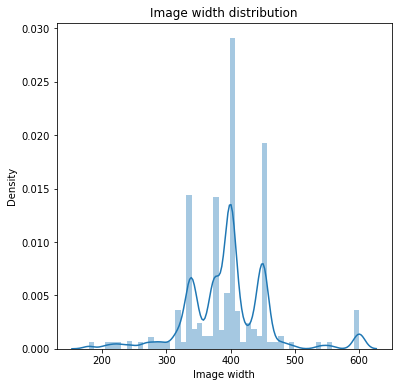

In [12]:
plt.figure(figsize=(6, 6))
sns.distplot(w)
plt.title('Image width distribution')
plt.xlabel('Image width')
plt.show()

The image width varies between 300 to 500 px with peak density at 400px.

### Image height distribution

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


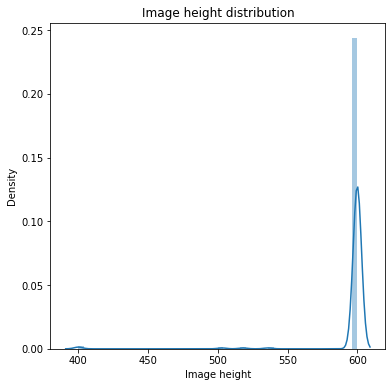

In [13]:
plt.figure(figsize=(6, 6))
sns.distplot(h)
plt.title('Image height distribution')
plt.xlabel('Image height')
plt.show()

Almost all images have height 600px.

### Image Area Distribution

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


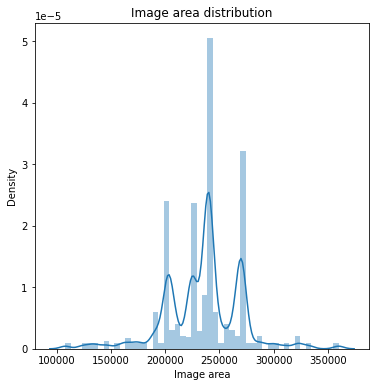

In [14]:
plt.figure(figsize=(6, 6))
plt.title('Image area distribution')
plt.xlabel('Image area')
sns.distplot(area)
plt.show()

Area of the images varies between 200k and 300k with peak value of 250k.

### Bounding Box per image and their size analysis

In [15]:
bbox_counts = []
for idx in tqdm(range(len(mat_df['wordBB']))):
    bbox_counts.append(mat_df['wordBB'][idx].shape[-1])

100%|██████████| 858750/858750 [00:05<00:00, 150657.07it/s]


In [16]:
pd.DataFrame({
    'bbox_counts': bbox_counts
}).describe()

,bbox_counts
count,858750.000000
mean,8.547412
std,4.700975
min,2.000000
25%,5.000000
50%,8.000000
75%,11.000000
max,63.000000


There are 8.55 bboxes per image on an average, with minimum of 2 bounding boxes per image and maximum of 63 bounding boxes per image.

### Distribution of bounding box counts per image

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


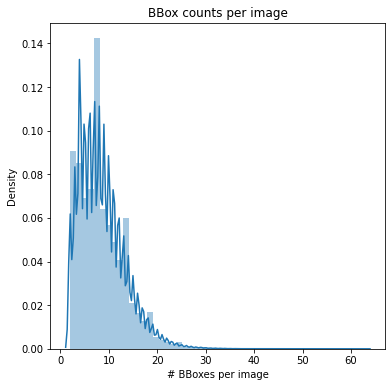

In [17]:
plt.figure(figsize=(6, 6))
sns.distplot(bbox_counts)
plt.title('BBox counts per image')
plt.xlabel('# BBoxes per image')
plt.show()

From the above PDF, it's clear that almost all the images have less than 30 bounding boxes.

### Bounding Boxes' size analysis

In [18]:
def euclidean_dist(p1, p2):
    """
    Calculates euclidean distances between given two points.
    In this case, finding width/height of the rectangular bboxes
    by taking difference between their coordinates would not work
    because the bboxes can be oriented based on the corresponding
    text alignment.
    """
    # Conver to numpy array for ease of calculations
    p1, p2 = np.array(p1), np.array(p2)
    return np.sqrt(np.sum((p1-p2)**2))

bbox_w, bbox_h, bbox_area = [], [], []

for idx in tqdm(range(len(mat_df['wordBB'].iloc[:20000]))):
    for bbox_idx in range(mat_df['wordBB'][idx].shape[-1]):
        if len(mat_df['wordBB'][idx].shape) == 2:
            top_left = (mat_df['wordBB'][idx][0][0], mat_df['wordBB'][idx][1][0])
            top_right = (mat_df['wordBB'][idx][0][1], mat_df['wordBB'][idx][1][1])
            bottom_left = (mat_df['wordBB'][idx][0][3], mat_df['wordBB'][idx][1][3])
        else:
            top_left = (mat_df['wordBB'][idx][0][0][bbox_idx], mat_df['wordBB'][idx][1][0][bbox_idx])
            top_right = (mat_df['wordBB'][idx][0][1][bbox_idx], mat_df['wordBB'][idx][1][1][bbox_idx])
            bottom_left = (mat_df['wordBB'][idx][0][3][bbox_idx], mat_df['wordBB'][idx][1][3][bbox_idx])

        w = euclidean_dist(top_left, top_right)
        h = euclidean_dist(top_left, bottom_left)
        
        bbox_w.append(w)
        bbox_h.append(h)
        bbox_area.append(w*h)

100%|██████████| 20000/20000 [00:14<00:00, 1398.11it/s]


In [19]:
pd.DataFrame({
    'bbox_w': bbox_w, 
    'bbox_h': bbox_h,
    'bbox_area': bbox_area
}).describe()

,bbox_w,bbox_h,bbox_area
count,182889.000000,182889.000000,182889.000000
mean,77.311162,27.800417,2641.053871
std,54.035157,16.278421,3981.650073
min,0.000000,0.655989,0.000000
25%,42.704796,17.707298,802.415833
50%,63.105194,23.156744,1409.738281
75%,95.810478,32.449223,2780.322021
max,651.642273,366.564148,129179.851562


I used only first 20K images to analyse their bounding boxes. In those image, there are total ~183K bounding boxes.

They have average area of ~2641 px^2, with minimum area of 0 and maximum area of 129K px^2.

The bboxes having 0 area will needed to be removed as part of preprocessing step before training the model.

### Bounding Box Width Distribution

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


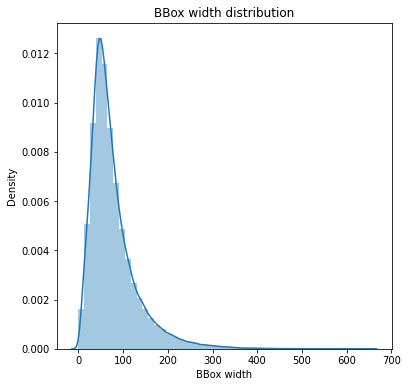

In [20]:
plt.figure(figsize=(6, 6))
sns.distplot(bbox_w)
plt.title('BBox width distribution')
plt.xlabel('BBox width')
plt.show()

### Bounding Box Height Distribution

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


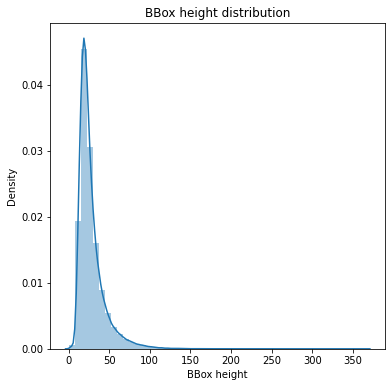

In [21]:
plt.figure(figsize=(6, 6))
sns.distplot(bbox_h)
plt.title('BBox height distribution')
plt.xlabel('BBox height')
plt.show()

### Bounding Box area distribution

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


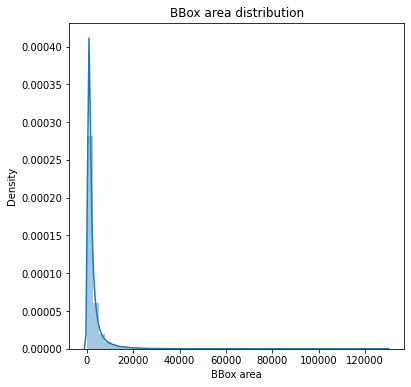

In [22]:
plt.figure(figsize=(6, 6))
sns.distplot(bbox_area)
plt.title('BBox area distribution')
plt.xlabel('BBox area')
plt.show()

From the above 3 plots, the width of bboxes varies the most (between 0 to 300 px). The reason is obvious: There are words having different lengths in the iamges.

Let's now explore the types/categories of background images in this dataset.

In [23]:
background_cats = set()

cat_re = re.compile(r'\d+/([a-zA-Z0-9]+)')

for img_name in mat_df['imnames'].values:
    background_cats.add(cat_re.search(img_name).group(1))

print("\n".join(list(background_cats)))

hiking
aquarium
lobby
camping
mesh
zoo
building
net
coffee
window
rain
chocolate
city
clouds
ant
ballet
sandwich
wozniak
swan
leather
warehouse
birds
coal
fruits
traffic
living
jogging
hill
concert
war
hubble
person
san
street
baroque
zebra
indian
empty
cows
batman
bedroom
vintage
bob
silk
bay
stanford
photos
peacock
clothes
desert
images
stage
jaipur
kathmandu
richard
steel
sea
hedge
lion
kathak
house
berkeley
texture
delhi
wall
flowers
village
crater
dog
leopard
dubai
places
student
tree
study
nile
night
maze
horse
pottery
cambridge
oxford
punting
park
asphalt
newton
tennis
tyres
swimming
resort
road
kite
turtles
sun
planet
koala
eagle
cream
kerala
monuments
mouth
woollens
rajasthan
eric
farm
museums
farmer
van
roti


### Visualizing only images with different backgrounds

In [24]:
def plot(images, titles=None):
    """
    Plot the grid of 2x2 image from the given list of image paths.
    """
    f, ax = plt.subplots(2, 2, figsize=(16, 12))
    ax = ax.flatten()

    for idx in range(4):
        # Read the image from given path and plot
        image = cv2.imread(images[idx], cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        if titles != None:
            # Add text in the image as title
            ax[idx].title.set_text(", ".join(list(map(str.strip, titles[idx]))))
        ax[idx].imshow(image)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  del sys.path[0]


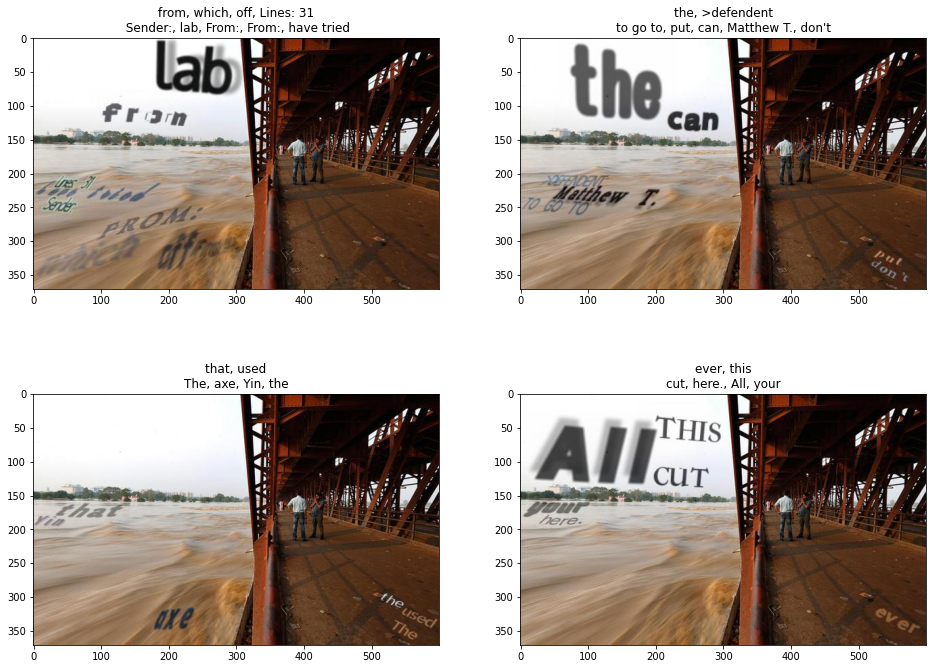

In [25]:
# Dir 48 contains images having "delhi" background
plot(
    partial_df_48['imnames'][1000:1004].values,
    partial_df_48['txt'][1000:1004].values
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  del sys.path[0]


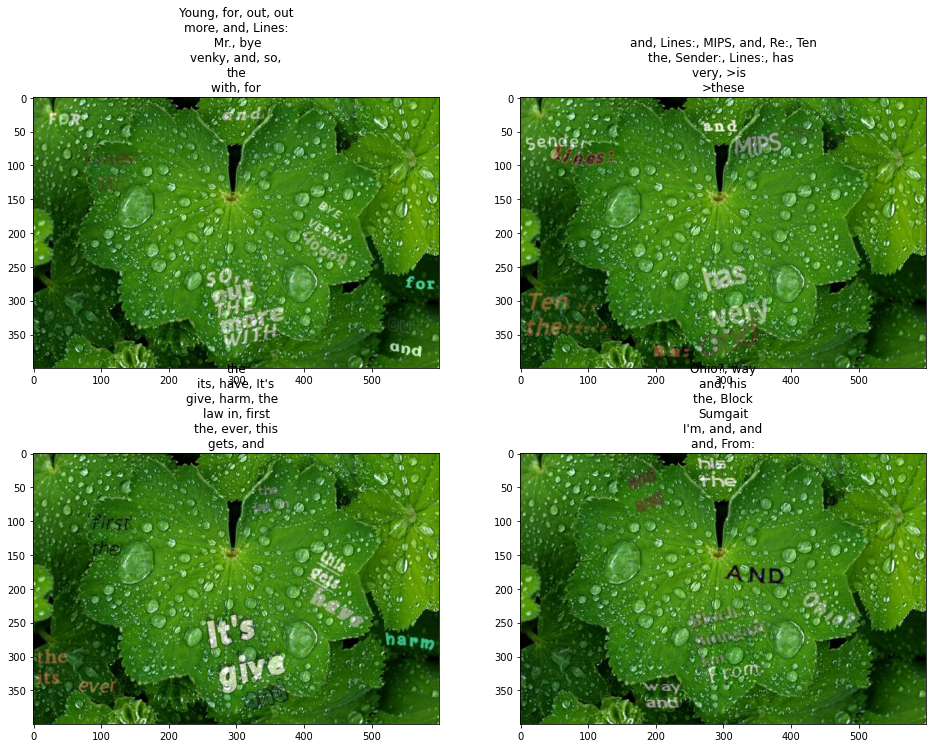

In [26]:
# Dir 48 contains images having "rain" background
plot(
    partial_df_139['imnames'][1000:1004].values,
    partial_df_139['txt'][1000:1004].values
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  del sys.path[0]


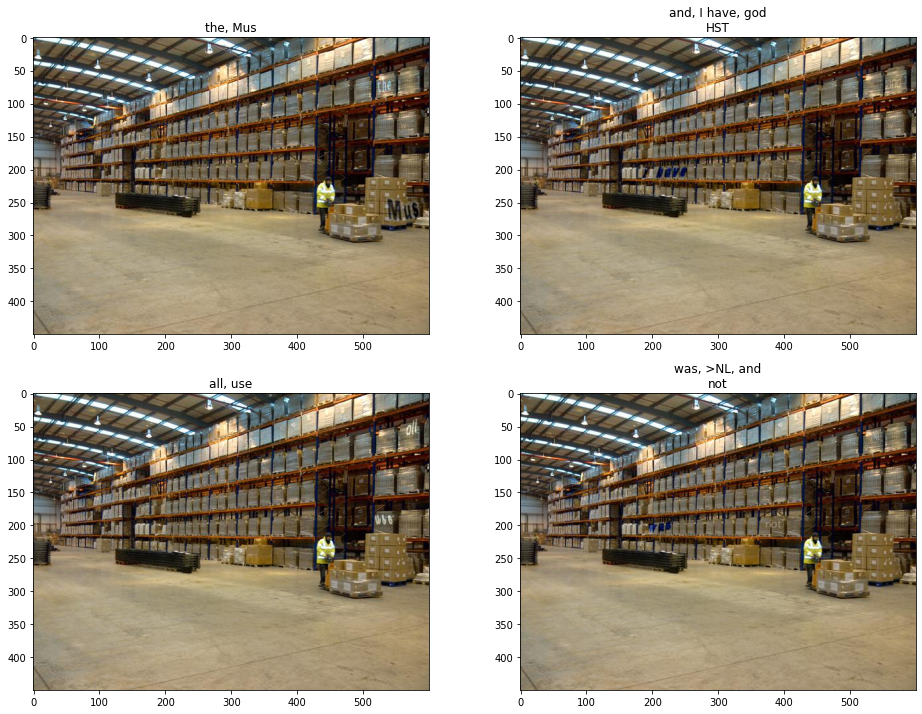

In [27]:
# Dir 48 contains images having "warehouse" background
plot(
    partial_df_193['imnames'][1000:1004].values,
    partial_df_193['txt'][1000:1004].values
)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  del sys.path[0]


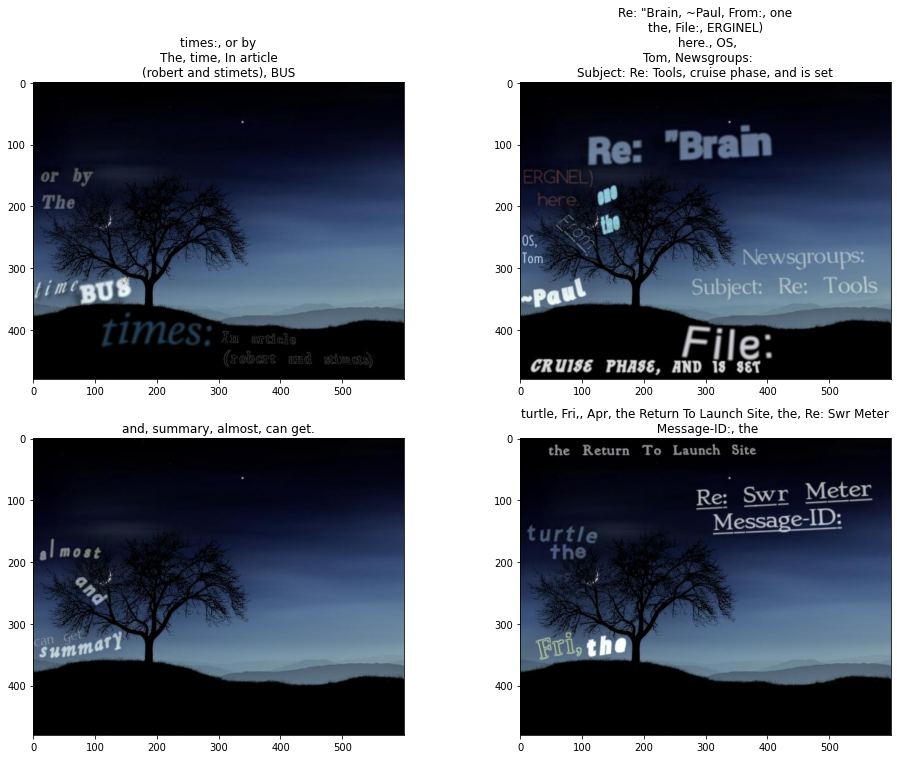

In [28]:
# Dir 117 contains images having "night" background
plot(
    partial_df_117['imnames'][1000:1004].values,
    partial_df_117['txt'][1000:1004].values
)

The title of each subplot contains the text in the corresponding image.

As we can see in the above image samples, the background images are from real word but the text is place over it randomly with different scale, orientation, brightness and locations. There are also some hard examples (in last 4 images), for which it's somewhat difficult to spot text on the first glance for humans. This will help in generalizing the text spotting model for real world text datasets. 

### Visualizing Word Level Bounding Boxes

In [29]:
partial_df_193['wordBB'].iloc[1000].shape

(2, 4, 2)

The shape of word level bounding boxes are of shape (2, 4, n_words), where 2 is for "x" and "y" coordinates, 4 is for 4 vertices of rectangle bounding boxes (clockwise, starting from top-left) and "n_words" is the number of words present in the given image.

Let's now visualize the bounding boxes on actual images.

In [30]:
def plot_bboxes(images, bboxes, titles, color='red'):
    """
    Plots bounding boxes over given image.
    """
    f, ax = plt.subplots(2, 2, figsize=(16, 12))
    ax = ax.flatten()

    for idx in range(4):
        # Read the image from given path and plot
        image = cv2.imread(os.path.join(BASE_DIR, f'{images[idx]}'), cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        # Reference: https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.patches.Polygon.html
        for bbox_idx in range(bboxes[idx].shape[-1]):
            # Define rectangle vertices
            vertices = [
                (bboxes[idx][0][0][bbox_idx], bboxes[idx][1][0][bbox_idx]),
                (bboxes[idx][0][1][bbox_idx], bboxes[idx][1][1][bbox_idx]),
                (bboxes[idx][0][2][bbox_idx], bboxes[idx][1][2][bbox_idx]),
                (bboxes[idx][0][3][bbox_idx], bboxes[idx][1][3][bbox_idx])
            ]
            # Draw the affine rectangle (polygon)
            bbox = patches.Polygon(
                vertices,
                linewidth=2,
                edgecolor=color,
                facecolor='none',
            )
            ax[idx].add_patch(bbox)

        ax[idx].title.set_text(", ".join(list(map(str.strip, titles[idx]))))
        ax[idx].imshow(image)

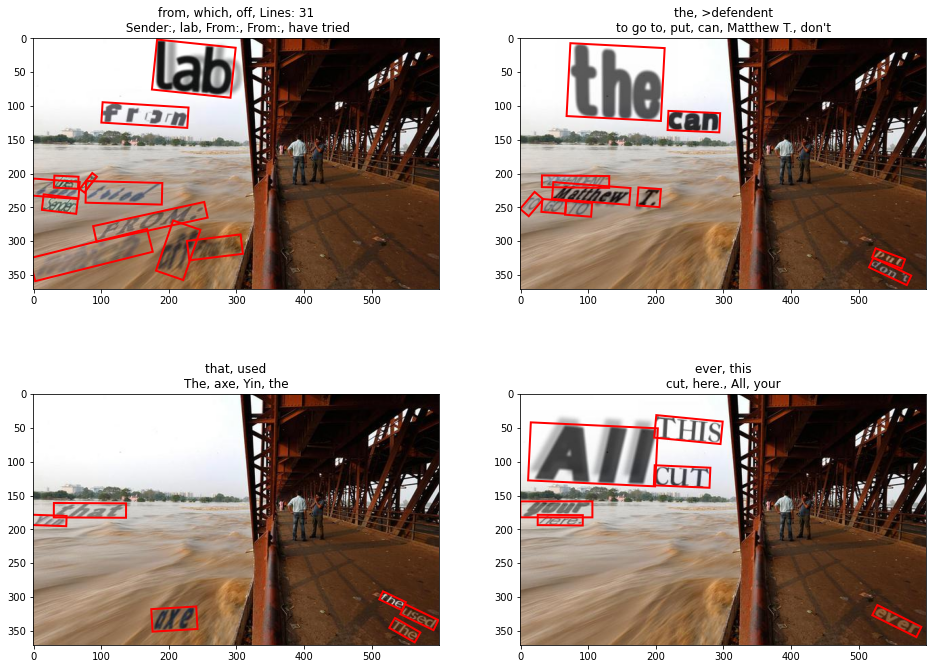

In [31]:
plot_bboxes(
    partial_df_48['imnames'][1000:1004].values,
    partial_df_48['wordBB'][1000:1004].values,
    partial_df_48['txt'][1000:1004].values
)

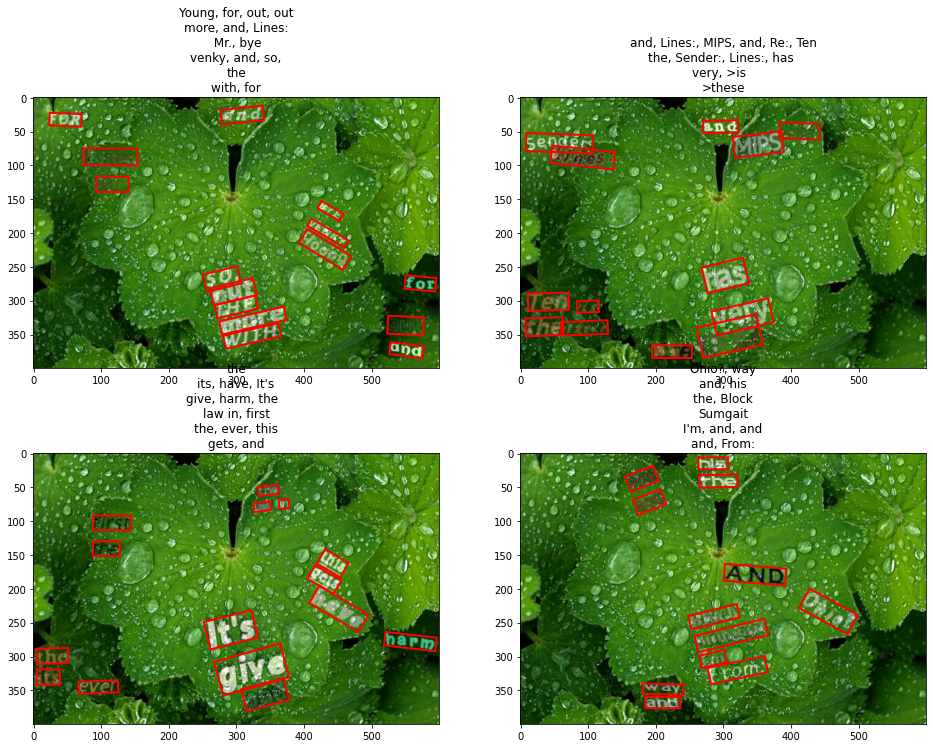

In [32]:
plot_bboxes(
    partial_df_139['imnames'].iloc[1000:1004].values,
    partial_df_139['wordBB'].iloc[1000:1004].values,
    partial_df_139['txt'][1000:1004].values
)

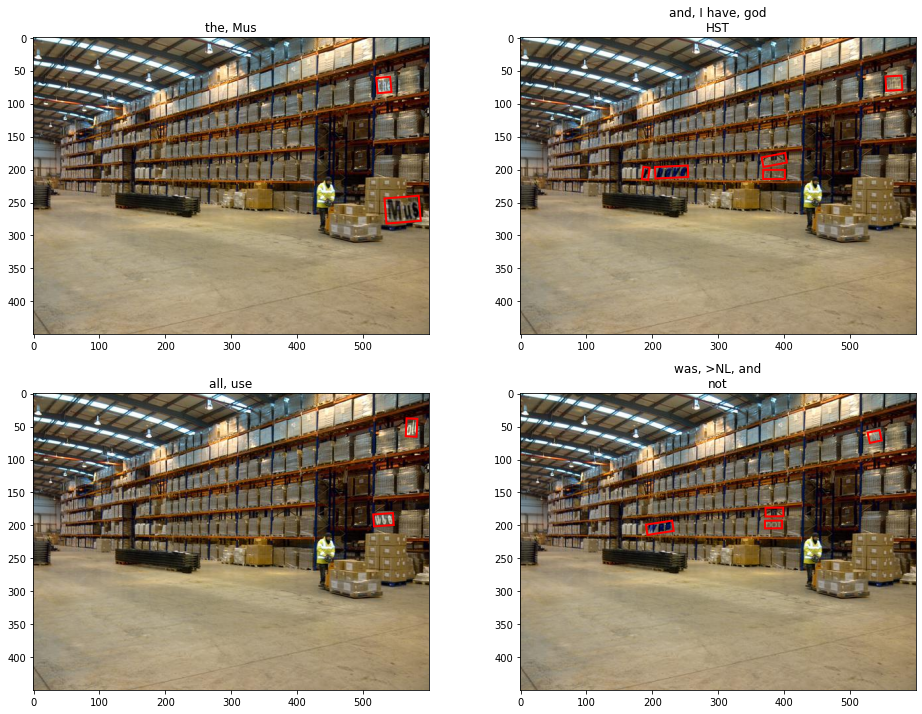

In [33]:
plot_bboxes(
    partial_df_193['imnames'].iloc[1000:1004].values,
    partial_df_193['wordBB'].iloc[1000:1004].values,
    partial_df_193['txt'][1000:1004].values
)

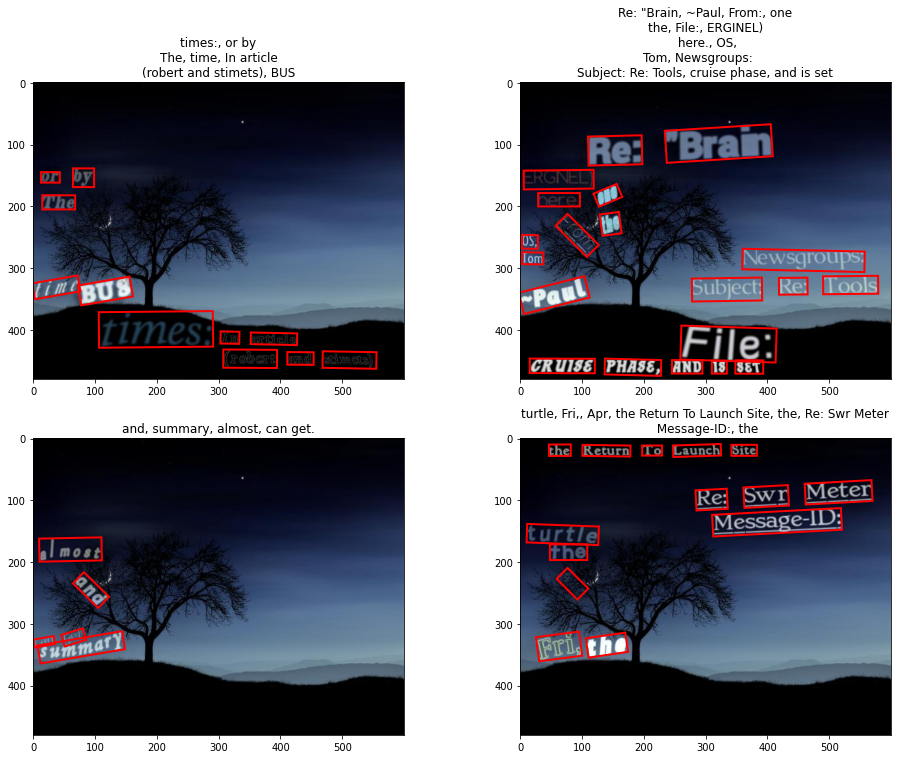

In [34]:
plot_bboxes(
    partial_df_117['imnames'].iloc[1000:1004].values,
    partial_df_117['wordBB'].iloc[1000:1004].values,
    partial_df_117['txt'][1000:1004].values
)

From the above plot, bounding boxes for words look pretty accurate.

In this dataset, we also have character level bounding boxes. Now let's visualize them as well.

### Character Level Bounding Boxes

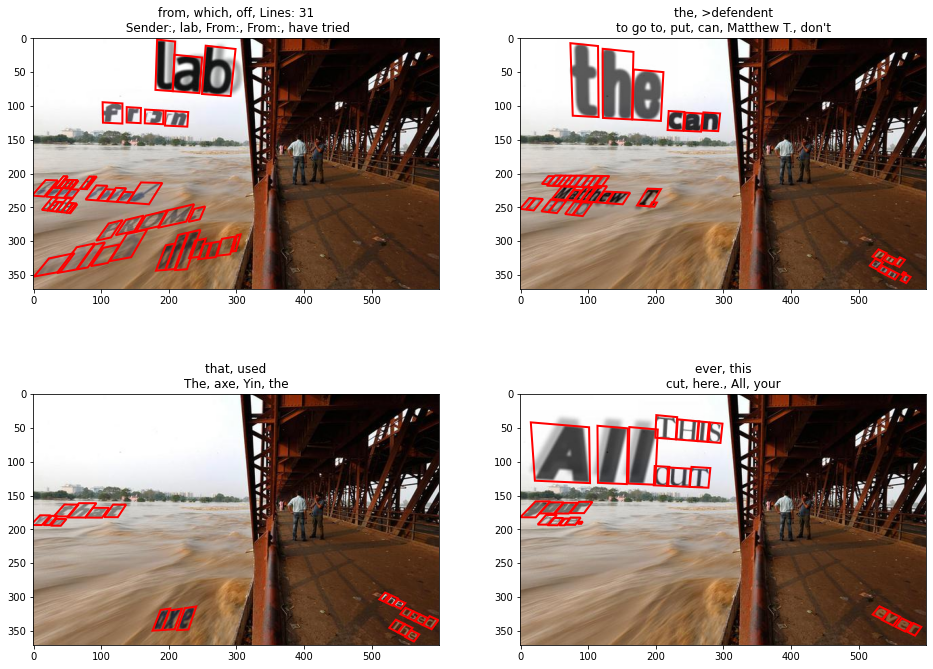

In [35]:
plot_bboxes(
    partial_df_48['imnames'].iloc[1000:1004].values,
    partial_df_48['charBB'].iloc[1000:1004].values,
    partial_df_48['txt'][1000:1004].values
)

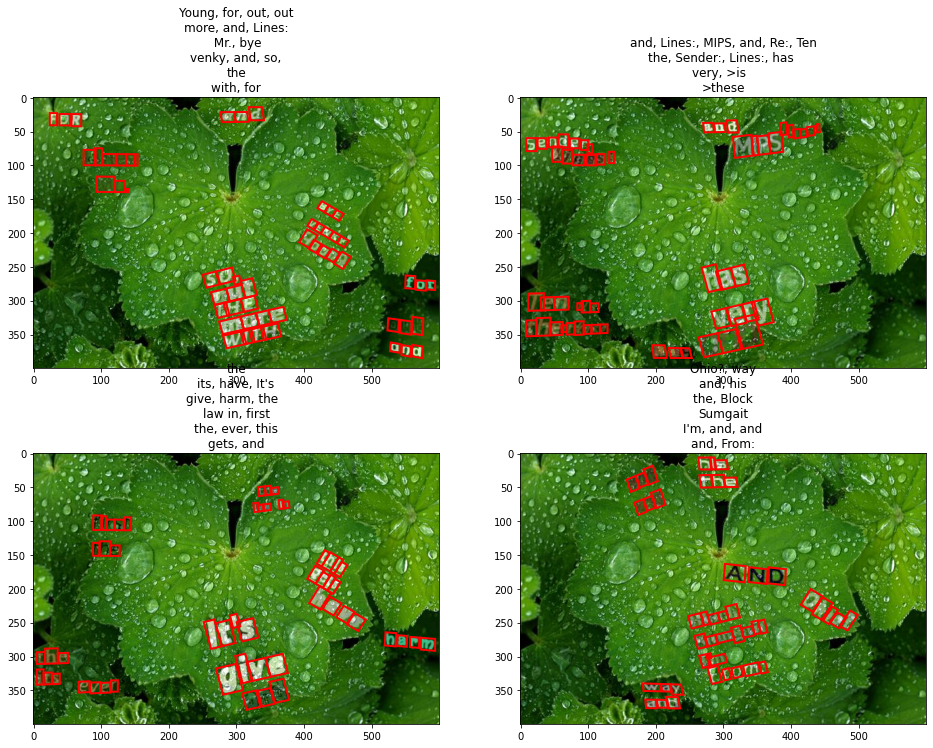

In [36]:
plot_bboxes(
    partial_df_139['imnames'].iloc[1000:1004].values,
    partial_df_139['charBB'].iloc[1000:1004].values,
    partial_df_139['txt'][1000:1004].values
)

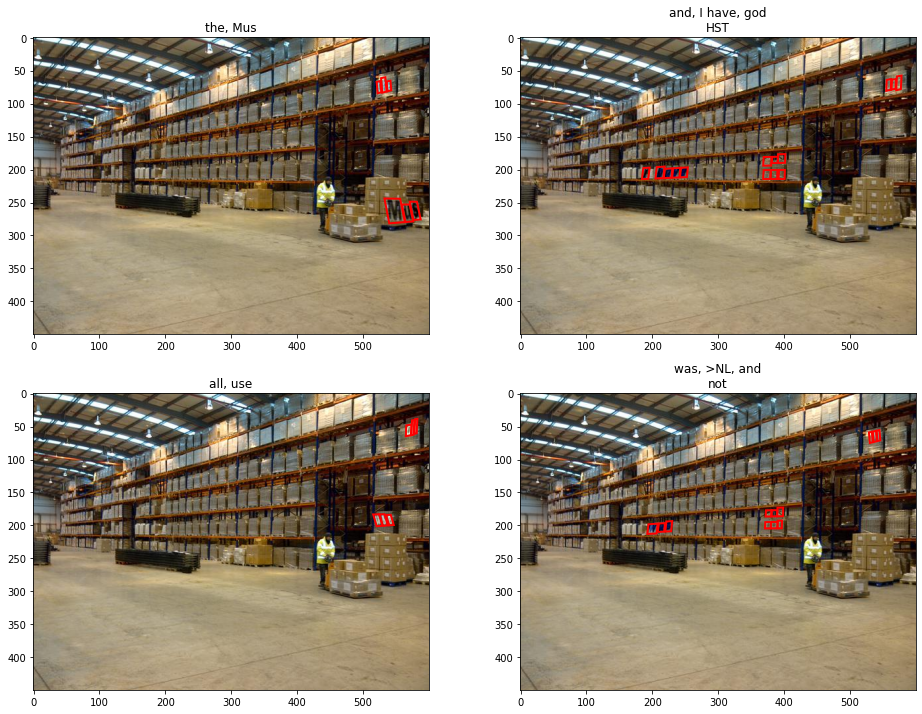

In [37]:
plot_bboxes(
    partial_df_193['imnames'].iloc[1000:1004].values,
    partial_df_193['charBB'].iloc[1000:1004].values,
    partial_df_193['txt'][1000:1004].values
)

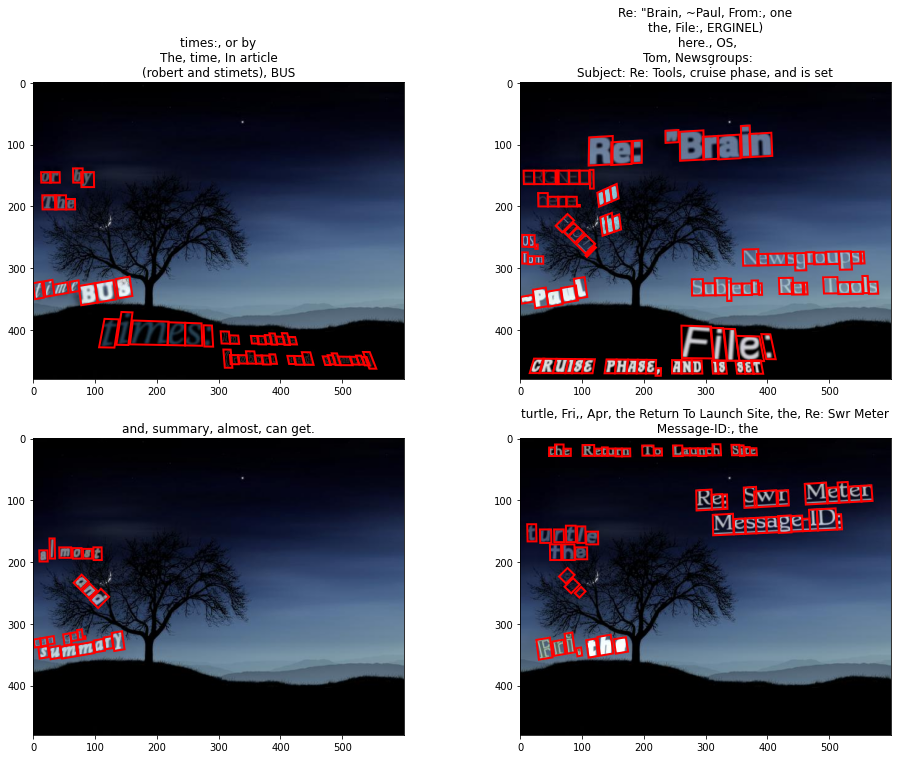

In [38]:
plot_bboxes(
    partial_df_117['imnames'].iloc[1000:1004].values,
    partial_df_117['charBB'].iloc[1000:1004].values,
    partial_df_117['txt'][1000:1004].values
)

Both character level bounding boxes and word level bounding boxes are as per the text's alignment.

# [ICDAR-2015 Dataset](https://rrc.cvc.uab.es/?ch=4&com=downloads)

### Download the dataset

The dataset can be downloaded from here: https://rrc.cvc.uab.es/?ch=4&com=downloads. We will be using "End to End" dataset from the above page, which contains information for both text detection and text recognition.

In [39]:
# Training images
!wget https://rrc.cvc.uab.es/downloads/ch4_training_images.zip
# Ground truths
!wget https://rrc.cvc.uab.es/downloads/ch4_training_localization_transcription_gt.zip

# Unzip and organize
!mkdir -p /content/icdar2015/train_imgs/
!mkdir -p /content/icdar2015/train_gt/
!unzip -qq /content/ch4_training_images.zip -d /content/icdar2015/train_imgs/
!unzip -qq /content/ch4_training_localization_transcription_gt.zip -d /content/icdar2015/train_gt

# Cleanup
!rm -rf /content/ch4_training_images.zip
!rm -rf /content/ch4_training_localization_transcription_gt.zip

--2021-02-09 17:31:31--  https://rrc.cvc.uab.es/downloads/ch4_training_images.zip
Resolving rrc.cvc.uab.es (rrc.cvc.uab.es)... 158.109.8.55
Connecting to rrc.cvc.uab.es (rrc.cvc.uab.es)|158.109.8.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90667586 (86M) [application/zip]
Saving to: ‘ch4_training_images.zip’

ch4_training_images 100%[===================>]  86.47M  10.4MB/s    in 8.4s    

2021-02-09 17:31:40 (10.3 MB/s) - ‘ch4_training_images.zip’ saved [90667586/90667586]

--2021-02-09 17:31:40--  https://rrc.cvc.uab.es/downloads/ch4_training_localization_transcription_gt.zip
Resolving rrc.cvc.uab.es (rrc.cvc.uab.es)... 158.109.8.55
Connecting to rrc.cvc.uab.es (rrc.cvc.uab.es)|158.109.8.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 344624 (337K) [application/zip]
Saving to: ‘ch4_training_localization_transcription_gt.zip’

ch4_training_locali 100%[===================>] 336.55K   533KB/s    in 0.6s    

2021-02-09 17:31:4

## Exploratory Data Analysis (EDA)

In [41]:
print(f'Total number of training images: {len(os.listdir("/content/icdar2015/train_imgs"))}')

Total number of training images: 1000


There are only 1000 images for training in ICDAR-2015 dataset. This dataset is way smaller than the Synth800K dataset but it's real world dataset. Therefore, we can first train the model on Synth800K to learn the generic features and then finetune the model on real world dataset (ICDAR-2015) to generalize the model performance on real world text/images.

In [42]:
# Create a dataframe for ease of operations
icdar_df = pd.DataFrame({
    'imnames': sorted(os.listdir('/content/icdar2015/train_imgs')),
    'gt': sorted(os.listdir('/content/icdar2015/train_gt'))
})
icdar_df['imnames'] = '/content/icdar2015/train_imgs' + os.sep + icdar_df['imnames'].astype(str)
icdar_df['gt'] = '/content/icdar2015/train_gt' + os.sep + icdar_df['gt'].astype(str)
icdar_df.head()

,imnames,gt
0,/content/icdar2015/train_imgs/img_1.jpg,/content/icdar2015/train_gt/gt_img_1.txt
1,/content/icdar2015/train_imgs/img_10.jpg,/content/icdar2015/train_gt/gt_img_10.txt
2,/content/icdar2015/train_imgs/img_100.jpg,/content/icdar2015/train_gt/gt_img_100.txt
3,/content/icdar2015/train_imgs/img_1000.jpg,/content/icdar2015/train_gt/gt_img_1000.txt
4,/content/icdar2015/train_imgs/img_101.jpg,/content/icdar2015/train_gt/gt_img_101.txt


### Image size stats

In [43]:
w, h = [], []
for img in tqdm(icdar_df['imnames'].values):
    image = cv2.imread(img, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    w.append(image.shape[0])
    h.append(image.shape[1])

100%|██████████| 1000/1000 [00:14<00:00, 69.00it/s]


In [44]:
area = np.array(w) * np.array(h)

image_size_stats = pd.DataFrame({
    'w': w,
    'h': h,
    'area': area
})

image_size_stats.describe()

,w,h,area
count,1000.0,1000.0,1000.0
mean,720.0,1280.0,921600.0
std,0.0,0.0,0.0
min,720.0,1280.0,921600.0
25%,720.0,1280.0,921600.0
50%,720.0,1280.0,921600.0
75%,720.0,1280.0,921600.0
max,720.0,1280.0,921600.0


All the 1000 images have same width and height (hence same area). Therefore, no need to plot PDFs for these stats. Let's directly jump to Bbox analysis after some basic image visualizations.

### Visualizing only images

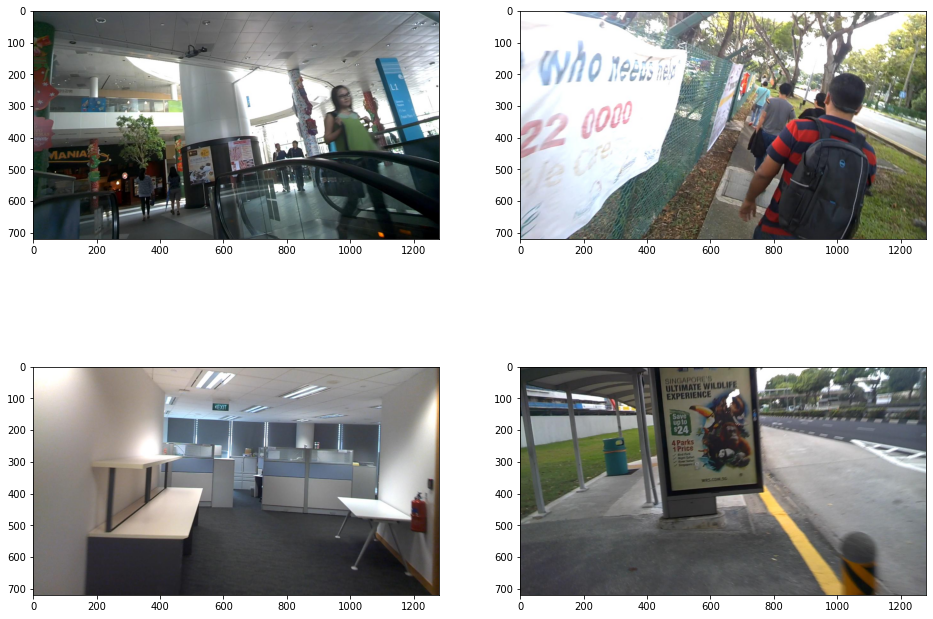

In [46]:
plot(icdar_df['imnames'][100:104].values)

### A few more images

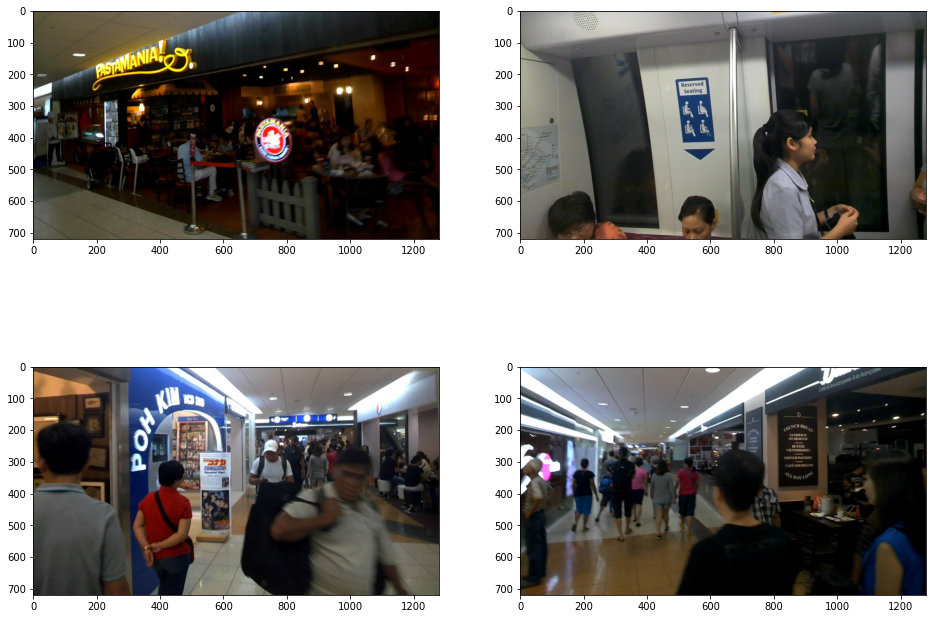

In [47]:
plot(icdar_df['imnames'][500:504].values)

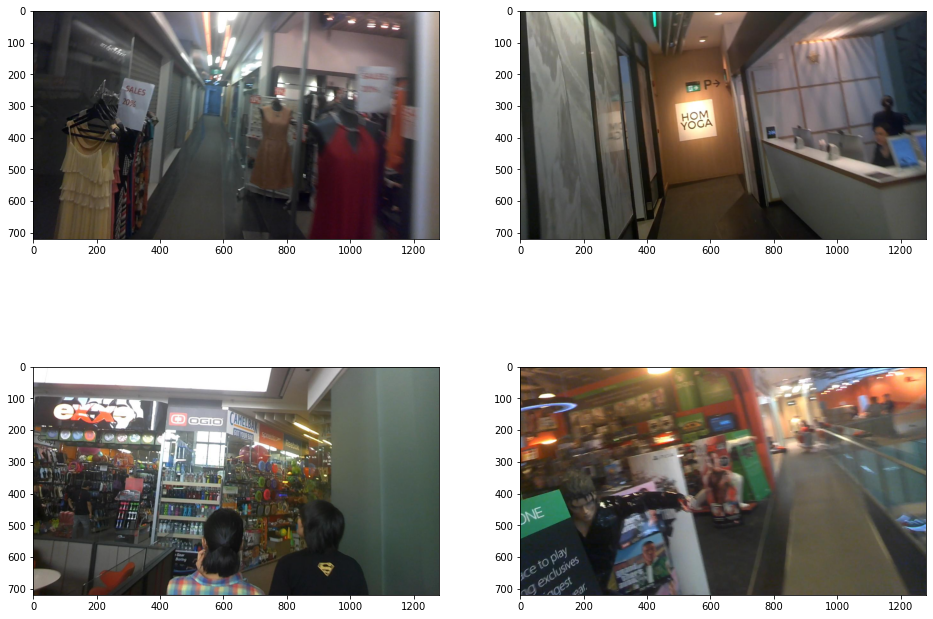

In [48]:
plot(icdar_df['imnames'][-4:].values)

As we can see in the above images, the text in the real world images are quite difficult to spot as compared to Synth800K dataset. Because it seems that in most of the real world images, the text size is very small or has lower brightness.

Therefore, it's necessary to finetune the model on these images to get the decent model performance on such images.

### Visualizing Ground Truth Bounding Boxes

Let's first check the format of labels/ground truths and corresponding iamge.

In [49]:
!cat /content/icdar2015/train_gt/gt_img_1.txt

﻿377,117,463,117,465,130,378,130,Genaxis Theatre
493,115,519,115,519,131,493,131,[06]
374,155,409,155,409,170,374,170,###
492,151,551,151,551,170,492,170,62-03
376,198,422,198,422,212,376,212,Carpark
494,190,539,189,539,205,494,206,###
374,1,494,0,492,85,372,86,###


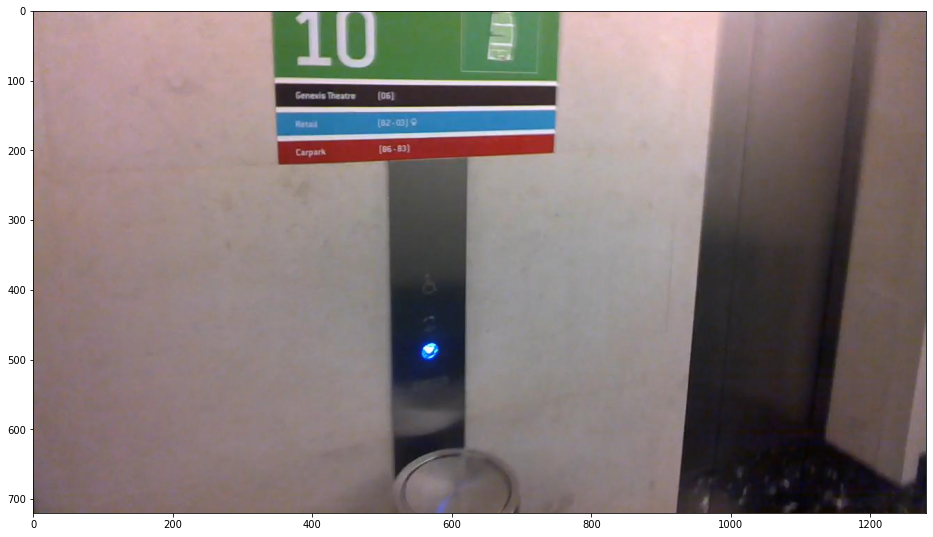

In [50]:
# Plot a single image
plt.figure(figsize=(16, 16))
image = cv2.imread('/content/icdar2015/train_imgs/img_1.jpg', cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
image /= 255.0
plt.imshow(image)
plt.show()

From this, the first thing we notice is that the images are large but pretty blur and the texts are smaller as compared to the background. 

Here is the format of the ground truth labels

> x1, y1, x2, y2, x3, y3, x4, y4, transcription

It contains the (x, y) coordinates of rectangle in clockwise manner starting from top left corner followed by corresponding text transcription (actual word in text).

The text transcription also contains "###", which means "Don't care" word. For now, we will ignore such words.

Reference: https://rrc.cvc.uab.es/?ch=4&com=tasks

In [51]:
# Adding ground truths to dataframe
def extract_gt(gt_path):
    """Extract ground truth coordinates from given text file."""
    # Reference: https://stackoverflow.com/a/49150749/5353128
    with open(gt_path, 'r', encoding='utf-8-sig') as f:
        content = f.read().split('\n')
        # Removing empty lines
        content = [line for line in content if line]
        return np.array(
            list(map(lambda str: str.split(',')[:-1], content)), dtype='object'
        )

def extract_txt(gt_path):
    """Extract ground truth text/transcript from given text file."""
    with open(gt_path, 'r', encoding='utf-8-sig') as f:
        content = f.read().split('\n')
        # Removing empty lines
        content = [line for line in content if line]
        return np.array(
            list(map(lambda str: str.split(',')[-1], content)), dtype='object'
        )

# Extract ground truth bounding boxes
icdar_df['gt_bboxes'] = icdar_df['gt'].map(extract_gt)

# Extract text for each ground truth
icdar_df['gt_txt'] = icdar_df['gt'].map(extract_txt)

In [52]:
icdar_df.head()

,imnames,gt,gt_bboxes,gt_txt
0,/content/icdar2015/train_imgs/img_1.jpg,/content/icdar2015/train_gt/gt_img_1.txt,"[[377, 117, 463, 117, 465, 130, 378, 130], [49...","[Genaxis Theatre, [06], ###, 62-03, Carpark, #..."
1,/content/icdar2015/train_imgs/img_10.jpg,/content/icdar2015/train_gt/gt_img_10.txt,"[[261, 138, 284, 140, 279, 158, 260, 158], [28...","[###, HarbourFront, CC22, bua, ###, ###, ###, ..."
2,/content/icdar2015/train_imgs/img_100.jpg,/content/icdar2015/train_gt/gt_img_100.txt,"[[645, 19, 686, 13, 692, 43, 651, 48], [689, 1...","[Way, out, ###, Line, Platform, ###, ###, ###]"
3,/content/icdar2015/train_imgs/img_1000.jpg,/content/icdar2015/train_gt/gt_img_1000.txt,"[[486, 216, 554, 211, 558, 243, 489, 248], [1,...","[###, ###, ###, ###]"
4,/content/icdar2015/train_imgs/img_101.jpg,/content/icdar2015/train_gt/gt_img_101.txt,"[[899, 214, 928, 213, 928, 241, 900, 242], [93...","[CARE, STICKER, FOR, ###, MORE, ###, ###, ###,..."


In [53]:
# Sanity check!
icdar_df[icdar_df['imnames'] == '/content/icdar2015/train_imgs/img_1.jpg']

,imnames,gt,gt_bboxes,gt_txt
0,/content/icdar2015/train_imgs/img_1.jpg,/content/icdar2015/train_gt/gt_img_1.txt,"[[377, 117, 463, 117, 465, 130, 378, 130], [49...","[Genaxis Theatre, [06], ###, 62-03, Carpark, #..."


### Bounding Box per image and their size analysis

In [54]:
bbox_counts = []
for idx in tqdm(range(len(icdar_df['gt_bboxes']))):
    bbox_counts.append(icdar_df['gt_bboxes'][idx].shape[-1])

100%|██████████| 1000/1000 [00:00<00:00, 98022.95it/s]


In [55]:
pd.DataFrame({
    'bbox_counts': bbox_counts
}).describe()

,bbox_counts
count,1000.000000
mean,8.235000
std,2.878204
min,6.000000
25%,8.000000
50%,8.000000
75%,8.000000
max,74.000000


In ICDAR-2015 dataset, there are similar number of bounding boxes per image on an average as compared to Synth800K dataset.

The minimum number of bboxes are 6 and max are 74 bboxes per image.

However, the distribution seems different from Synth800K data as 75%ile of images contains 8 bboxes.

### Distribution of bounding box counts per image

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


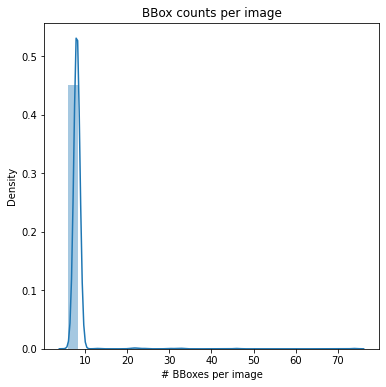

In [56]:
plt.figure(figsize=(6, 6))
sns.distplot(bbox_counts)
plt.title('BBox counts per image')
plt.xlabel('# BBoxes per image')
plt.show()

From the PDF, it's clear that almost all the images have ~8 bounding boxes.

### Bounding Box size analysis

In [68]:
bbox_w, bbox_h, bbox_area = [], [], []

for idx in tqdm(range(len(icdar_df['gt_bboxes']))):
    for bbox_idx in range(icdar_df['gt_bboxes'][idx].shape[0]):
        top_left = (icdar_df['gt_bboxes'][idx][bbox_idx][0], icdar_df['gt_bboxes'][idx][bbox_idx][1])
        top_right = (icdar_df['gt_bboxes'][idx][bbox_idx][2], icdar_df['gt_bboxes'][idx][bbox_idx][3])
        bottom_left = (icdar_df['gt_bboxes'][idx][bbox_idx][6], icdar_df['gt_bboxes'][idx][bbox_idx][7])

        top_left = tuple(map(int, top_left))
        top_right = tuple(map(int, top_right))
        bottom_left = tuple(map(int, bottom_left))

        w = euclidean_dist(top_left, top_right)
        h = euclidean_dist(top_left, bottom_left)
        
        bbox_w.append(w)
        bbox_h.append(h)
        bbox_area.append(w*h)

100%|██████████| 1000/1000 [00:00<00:00, 1149.86it/s]


In [69]:
pd.DataFrame({
    'bbox_w': bbox_w, 
    'bbox_h': bbox_h,
    'bbox_area': bbox_area
}).describe()

,bbox_w,bbox_h,bbox_area
count,11886.000000,11886.000000,11886.000000
mean,60.503995,25.089854,1913.422974
std,48.730878,22.689143,4196.313779
min,3.000000,1.000000,24.186773
25%,29.154759,13.341664,458.344848
50%,47.169906,19.104973,895.082673
75%,75.126559,29.017236,1882.924780
max,622.852310,657.076099,160833.667262


The smallest bbox has area of 24px^2 and the biggest bbox has area of 160833 px^2. Other stats like mean, min, median etc. are shown in the above table.

### Bounding Box Width Distribution

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


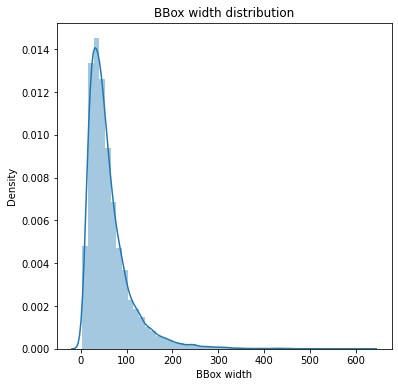

In [70]:
plt.figure(figsize=(6, 6))
sns.distplot(bbox_w)
plt.title('BBox width distribution')
plt.xlabel('BBox width')
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


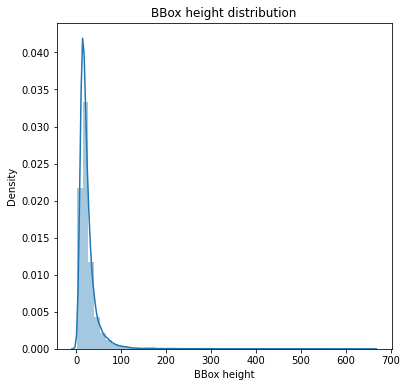

In [71]:
plt.figure(figsize=(6, 6))
sns.distplot(bbox_h)
plt.title('BBox height distribution')
plt.xlabel('BBox height')
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


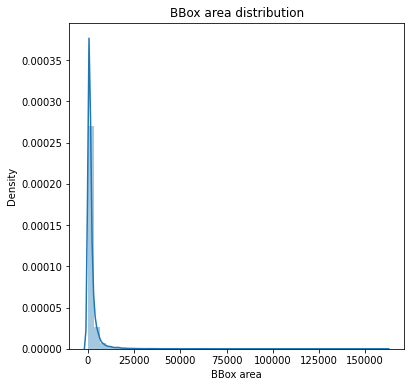

In [72]:
plt.figure(figsize=(6, 6))
sns.distplot(bbox_area)
plt.title('BBox area distribution')
plt.xlabel('BBox area')
plt.show()

BBox width, height and area distribution are almost similar to Synth800K dataset.

### Visualizing bounding boxes on the images

The format of bounding box list is somewhat different in this case. Redefining the plot_bbox method.

In [73]:
def plot_bboxes_icdar(images, bboxes, titles, color='red'):
    """
    Plots bounding boxes over given image.
    """
    f, ax = plt.subplots(2, 2, figsize=(16, 10))
    ax = ax.flatten()

    for idx in range(4):
        # Read the image from given path and plot
        image = cv2.imread(os.path.join(BASE_DIR, f'{images[idx]}'), cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        # Reference: https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.patches.Polygon.html
        for bbox_idx in range(bboxes[idx].shape[0]):
            # Define rectangle vertices
            vertices = [
                (bboxes[idx][bbox_idx][0], bboxes[idx][bbox_idx][1]),
                (bboxes[idx][bbox_idx][2], bboxes[idx][bbox_idx][3]),
                (bboxes[idx][bbox_idx][4], bboxes[idx][bbox_idx][5]),
                (bboxes[idx][bbox_idx][6], bboxes[idx][bbox_idx][7]),
            ]
            if list(map(str.strip, titles[idx]))[bbox_idx] != '###':
                # Draw the affine rectangle (polygon)
                bbox = patches.Polygon(
                    vertices,
                    linewidth=2,
                    edgecolor=color,
                    facecolor='none',
                )
                ax[idx].add_patch(bbox)

        ax[idx].title.set_text(", ".join([t for t in list(map(str.strip, titles[idx])) if t!='###']))
        ax[idx].imshow(image)

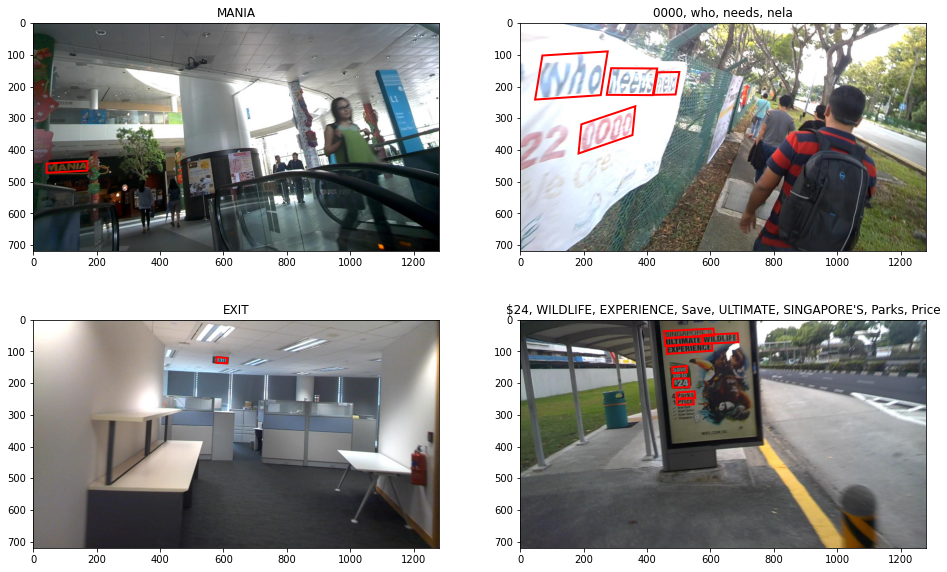

In [74]:
plot_bboxes_icdar(
    icdar_df['imnames'][100:104].values,
    icdar_df['gt_bboxes'][100:104].values,
    icdar_df['gt_txt'][100:104].values
)

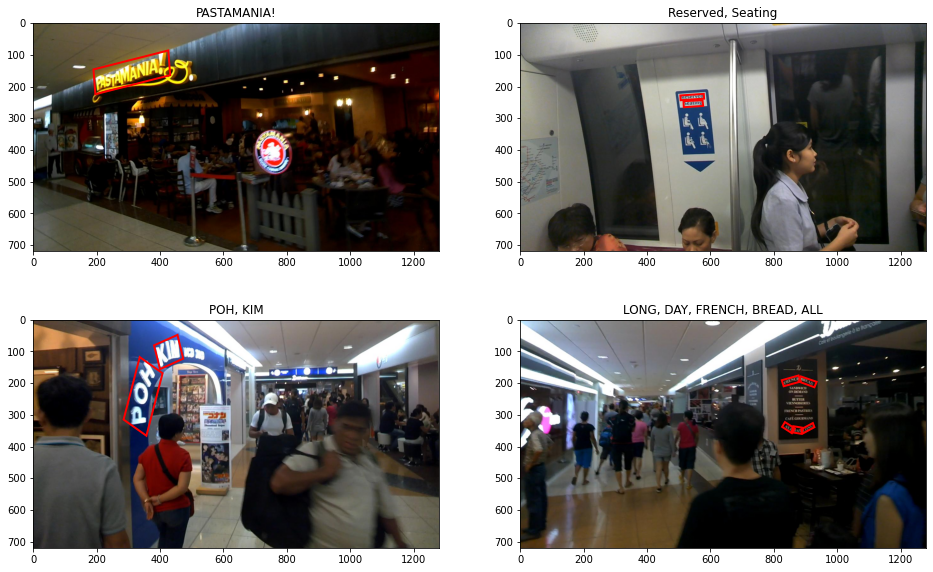

In [75]:
plot_bboxes_icdar(
    icdar_df['imnames'][500:504].values,
    icdar_df['gt_bboxes'][500:504].values,
    icdar_df['gt_txt'][500:504].values
)

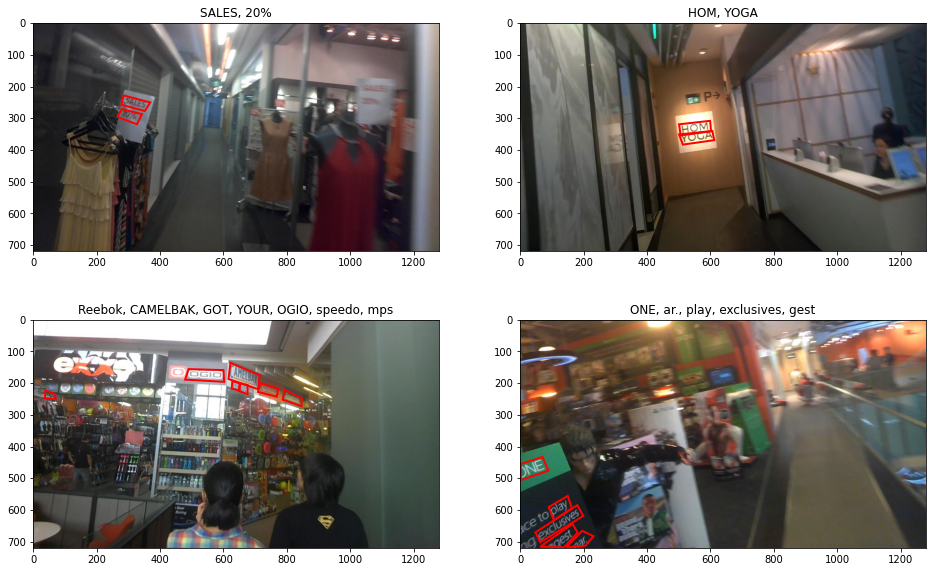

In [76]:
plot_bboxes_icdar(
    icdar_df['imnames'][-4:].values,
    icdar_df['gt_bboxes'][-4:].values,
    icdar_df['gt_txt'][-4:].values
)

ICDAR-2015 dataset does not contain bounding box annotations for charaters. Also, it's not required for FOTS model as the CRNN for text recognition will be trained using CTC loss, which do not require character level training.

## Final Observations

* Synth800K dataset is very large but does not represent the real world text situations.
* ICDAR-2015 dataset is very small but has real world situations of text alignment, scale, lightings, backgrounds etc.
* As the ICDAR-2015 dataset is smaller, it might not be enough for model generalization and there might be high chances of model overfitting.
* Image size of ICDAR-2015 is very large but they are having vely poor/low resolution as compared to Synth800K dataset because the images are from wearable camera.
* The word level bounding boxes will be useful for text detection and text labels will be useful for text recognition training.
* As of now, I don't see any use of character level bounding boxes given in the Synth800K dataset.
